In [1]:
import os, sys

sys.path.append("../")

from data import PollenDataset

In [2]:
dataset = PollenDataset()

In [4]:
dataset[0][1]

tensor([ 52.6305, 157.8416, 312.5064])

In [27]:
# find index of "17781_Common_thyme_Thymus_vulgaris_pollen_grain" in datset.stems
index = dataset.stems.index("17781_Common_thyme_Thymus_vulgaris_pollen_grain")


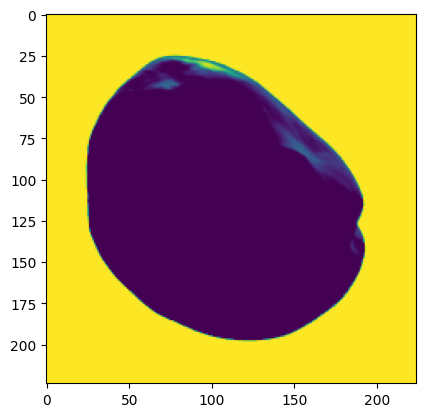

In [28]:
import matplotlib.pyplot as plt

plt.imshow(dataset[index][0][0].numpy())

In [1]:
import numpy as np

In [29]:
vox = np.bool(dataset[index][2] >= 0.5) #np.load("../predictions/pix2vox_base/17781_Common_thyme_Thymus_vulgaris_pollen_grain_vox.npy")

In [6]:
import trimesh
import matplotlib.pyplot as plt
import torch
import numpy as np

In [7]:
points = np.load("../data/processed/pointclouds/17831_Common_holly_Ilex_aquifolium_pollen_grain.npz")

In [ ]:
# plot the pointcloud in a fig(3d) plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points["points"][:, 0], points["points"][:, 1], points["points"][:, 2], s=0.1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title("Pointcloud of Common Holly Pollen Grain")
plt.show()

In [101]:
prediction = trimesh.load('../predictions/pix2vox_aug_frozen_encdec/17781_Common_thyme_Thymus_vulgaris_pollen_grain.stl')
#prediction.show()

In [102]:
mesh_gt = trimesh.load('../data/processed/interim/17781_Common_thyme_Thymus_vulgaris_pollen_grain.stl')
mesh_gt.show()

In [127]:
def align_icp(mesh_source, mesh_target, n_points=5000, max_iterations=10000, threshold=0.05):
    """
    Align mesh_source to mesh_target using Open3D ICP (point-to-plane).
    Returns:
        - mesh_aligned: transformed mesh_source
        - pts_src_aligned: transformed sampled source points
    """
    import open3d as o3d
    import numpy as np
    import trimesh

    src = mesh_source.copy()
    tgt = mesh_target.copy()

    # Normalize both meshes: center + scale to unit box
    def normalize_mesh_inplace(mesh):
        mesh.vertices -= mesh.vertices.mean(axis=0)
        scale = np.linalg.norm(mesh.vertices.max(axis=0) - mesh.vertices.min(axis=0))
        if scale > 0:
            mesh.vertices /= scale
        return mesh

    normalize_mesh_inplace(src)
    normalize_mesh_inplace(tgt)

    # Sample points
    pts_src, _ = trimesh.sample.sample_surface(src, n_points)
    pts_tgt, _ = trimesh.sample.sample_surface(tgt, n_points)

    # Convert to Open3D point clouds
    pcd_src = o3d.geometry.PointCloud()
    pcd_src.points = o3d.utility.Vector3dVector(pts_src)
    pcd_src.estimate_normals()

    pcd_tgt = o3d.geometry.PointCloud()
    pcd_tgt.points = o3d.utility.Vector3dVector(pts_tgt)
    pcd_tgt.estimate_normals()

    # Run ICP
    try:
        reg = o3d.pipelines.registration.registration_icp(
            pcd_src, pcd_tgt, threshold, np.eye(4),
            o3d.pipelines.registration.TransformationEstimationPointToPlane(),
            o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=max_iterations)
        )

        #print(f"[DEBUG][ICP] Fitness: {reg.fitness:.6f}, RMSE: {reg.inlier_rmse:.6f}")
        #print(f"[DEBUG][ICP] Transformation:\n{reg.transformation}")

        if reg.fitness < 1e-4:
            print(f"[WARNING] ICP failed: very low fitness. No alignment applied.")
            reg_trans = np.eye(4)
        else:
            reg_trans = reg.transformation

    except Exception as e:
        print(f"[ERROR] ICP failed due to exception: {e}")
        reg_trans = np.eye(4)

    # Apply transformation to mesh and points
    mesh_aligned = src.copy()
    mesh_aligned.apply_transform(reg_trans)

    pts_src_homo = np.hstack([pts_src, np.ones((pts_src.shape[0], 1))])
    pts_src_aligned = (reg_trans @ pts_src_homo.T).T[:, :3]

    return mesh_aligned, pts_src_aligned

In [128]:
mesh_pred_aligned, pts_pred_aligned = align_icp(prediction, mesh_gt)

In [129]:
mesh_pred_hull = mesh_pred_aligned

In [130]:
import numpy as np

def normalize_mesh(mesh):
    verts = mesh.vertices - mesh.vertices.mean(axis=0)
    scale = np.linalg.norm(verts.max(axis=0) - verts.min(axis=0))
    verts = verts / scale
    mesh.vertices = verts
    return mesh

mesh_gt_hull = normalize_mesh(mesh_gt.copy())

In [131]:
bbox = np.vstack([mesh_pred_hull.bounds, mesh_gt_hull.bounds])
bbox_min = bbox.min(axis=0)
bbox_max = bbox.max(axis=0)
max_dim = np.max(bbox_max - bbox_min)
pitch = max_dim / 32.0 if max_dim > 0 else 1.0

In [132]:
# Shift both meshes to the same origin for voxelization
mesh_pred_vox = mesh_pred_hull.copy()
mesh_gt_vox = mesh_gt_hull.copy()
mesh_pred_vox.apply_translation(-bbox_min)
mesh_gt_vox.apply_translation(-bbox_min)

<trimesh.Trimesh(vertices.shape=(198727, 3), faces.shape=(397436, 3))>

In [133]:
mesh_pred_vox_mat = mesh_pred_vox.voxelized(pitch).fill().matrix
mesh_gt_vox_mat = mesh_gt_vox.voxelized(pitch).fill().matrix

In [113]:
mesh_pred_vox.voxelized(pitch).fill().show()

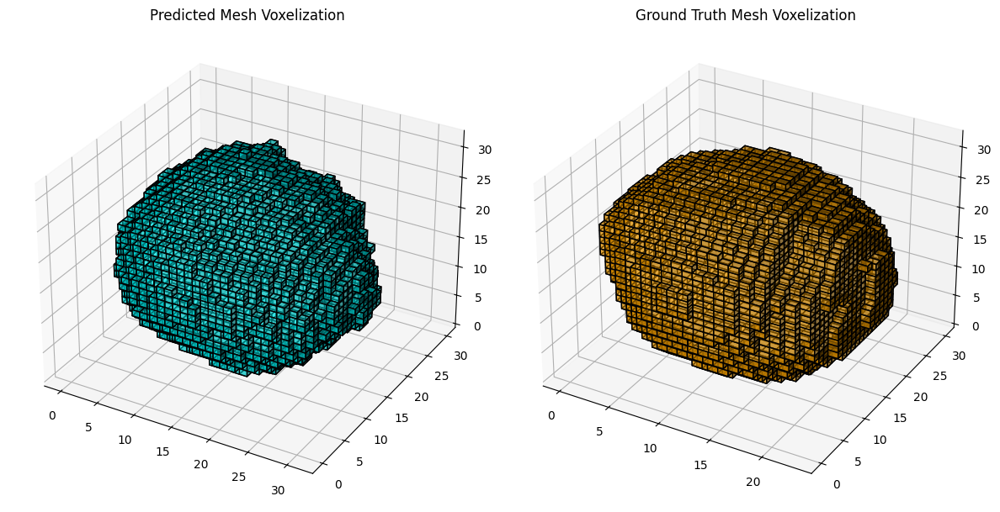

In [114]:
import matplotlib.pyplot as plt

# plo the mesh_pred_vox and mesh_gt_vox in a subplot
fig, axs = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection': '3d'})
axs[0].set_title('Predicted Mesh Voxelization')
axs[1].set_title('Ground Truth Mesh Voxelization')
axs[0].voxels(mesh_pred_vox_mat, edgecolor='k', facecolors='cyan', alpha=0.5)
axs[1].voxels(mesh_gt_vox_mat, edgecolor='k', facecolors='orange', alpha=0.5)
plt.tight_layout()
plt.show()

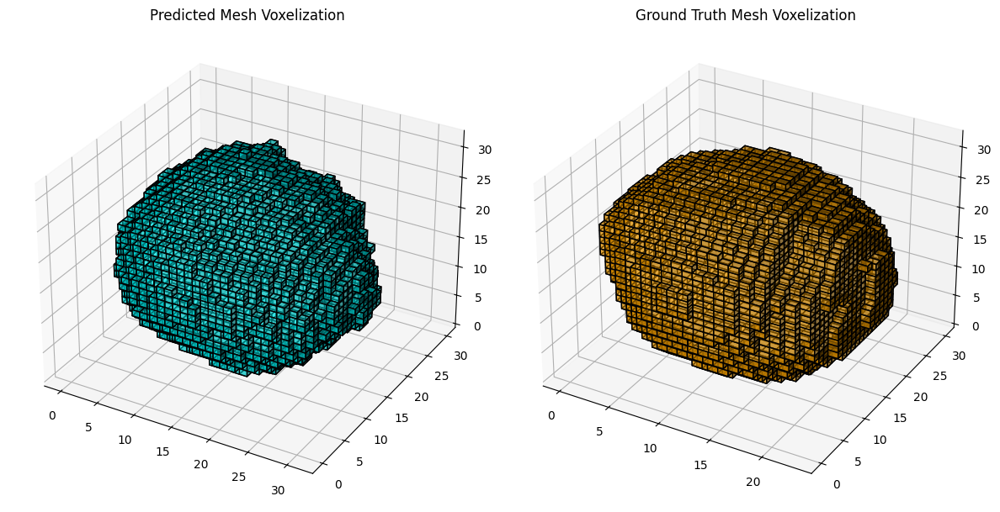

In [115]:
import matplotlib.pyplot as plt

# plo the mesh_pred_vox and mesh_gt_vox in a subplot
fig, axs = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection': '3d'})
axs[0].set_title('Predicted Mesh Voxelization')
axs[1].set_title('Ground Truth Mesh Voxelization')
axs[0].voxels(mesh_pred_vox_mat, edgecolor='k', facecolors='cyan', alpha=0.5)
axs[1].voxels(mesh_gt_vox_mat, edgecolor='k', facecolors='orange', alpha=0.5)
plt.tight_layout()
plt.show()

In [134]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def mesh_iou_plot(mesh_pred, mesh_gt, pitch=0.02):
    """
    Voxelizes two meshes at the given pitch, flood-fills their interiors,
    recenters them, computes IoU, and visualizes the union occupancy grid.

    Parameters
    ----------
    mesh_pred : trimesh.Trimesh
        Predicted mesh.
    mesh_gt : trimesh.Trimesh
        Ground-truth mesh.
    pitch : float
        Edge length of each voxel.

    Returns
    -------
    float
        Intersection-over-Union of the two meshes.
    """
    # Make copies to avoid modifying originals
    m_pred = mesh_pred.copy()
    m_gt = mesh_gt.copy()

    # Center each mesh
    center_pred = (m_pred.bounds[0] + m_pred.bounds[1]) * 0.5
    center_gt   = (m_gt.bounds[0]   + m_gt.bounds[1])   * 0.5
    m_pred.apply_translation(-center_pred)
    m_gt.apply_translation(-center_gt)

    # Voxelize and fill interiors
    vox_pred = m_pred.voxelized(pitch).fill()
    vox_gt   = m_gt.voxelized(pitch).fill()

    # Extract points
    pts_pred = np.array(vox_pred.points)
    pts_gt   = np.array(vox_gt.points)

    # Combine for union grid
    all_pts = np.vstack([pts_pred, pts_gt])
    mins = all_pts.min(axis=0)
    
    # Convert points to integer grid indices
    idx_pred = np.round((pts_pred - mins) / pitch).astype(int)
    idx_gt   = np.round((pts_gt   - mins) / pitch).astype(int)

    # Determine grid size
    max_idx = np.max(np.vstack([idx_pred, idx_gt]), axis=0) + 1
    grid = np.zeros(max_idx, dtype=bool)

    # Fill union
    grid[tuple(idx_pred.T)] = True
    grid[tuple(idx_gt.T)]   = True

    # Compute IoU
    set_pred = {tuple(idx) for idx in idx_pred}
    set_gt   = {tuple(idx) for idx in idx_gt}
    inter = len(set_pred & set_gt)
    union = len(set_pred | set_gt)
    iou = 0.0 if union == 0 else inter / union

    return iou

In [135]:
mesh_iou_plot(mesh_pred_vox, mesh_gt_vox, pitch=pitch)

0.7327868852459016

In [4]:
import sys, os

sys.path.append('../')

import trimesh

In [5]:
ox = trimesh.load('data/processed/interim/17803_Ox-eye_daisy_Leucanthemum_vulgare_pollen_grain.stl')

ValueError: string is not a file: `data/processed/interim/17803_Ox-eye_daisy_Leucanthemum_vulgare_pollen_grain.stl`